In [19]:
import os

from IPython.display import Image as DisplayImage
import numpy as np
from PIL import Image
import torch
import torch.utils.data as data
from torchvision import datasets
from torchvision.io import decode_image
from torchvision.io import read_image
import torchvision.transforms as transforms
import torchvision.utils as vutils
from tqdm.auto import tqdm

import helper_utils

In [4]:
# Check if the OxfordIIITPet data folder exists
ox3_pet_data_path = './oxford3pet_data'
if os.path.exists(ox3_pet_data_path) and os.path.isdir(ox3_pet_data_path):
    ox3_pet_download = False  # Data folder exists, will be loaded from
else:
    ox3_pet_download = True  # Data folder doesn't exist, will be downloaded

In [6]:
image = Image.open("./images/mangoes.jpg")

# Dimensions of the original PIL image
print("Original PIL Image Dimensions:", image.size)
print(f"The maximum pixel value is: {image.getextrema()[0][1]}, and the minumum is {image.getextrema()[0][0]}")

Original PIL Image Dimensions: (2048, 2048)
The maximum pixel value is: 255, and the minumum is 0


* `transforms.ToTensor()`: Converts a PIL image object into a PyTorch Tensor.
    * **Dimension Change**: This transform rearranges the image data from Pillow's `(Width, Height)` format to PyTorch's `(Channels, Height, Width)` format.  It also scales the image's pixel values from the `[0, 255]` range to a floating point `[0.0, 1.0]` range.

In [8]:
img_tensor = transforms.ToTensor()(image)

# Dimensions (shape) of the tensor
# [C, H, W] format
print(f"Dimensions After Converting to a Tensor: {img_tensor.shape}")
print(f"The maximum pixel value is: {img_tensor.max()}, and the minimum is: {img_tensor.min()}")

Dimensions After Converting to a Tensor: torch.Size([3, 2048, 2048])
The maximum pixel value is: 1.0, and the minimum is: 0.0


* `transforms.ToPILImage()`: Converts a PyTorch Tensor back into a PIL image object.
    * **Dimension Change**: It performs the reverse, converting a `(Channels, Height, Width)` tensor back into a PIL image that reports its size as `(Width, Height)`.

In [10]:
img_pil = transforms.ToPILImage()(img_tensor)

# Dimensions of the converted back PIL image
print("Dimensions After Converting Back to PIL:", img_pil.size)

Dimensions After Converting Back to PIL: (2048, 2048)


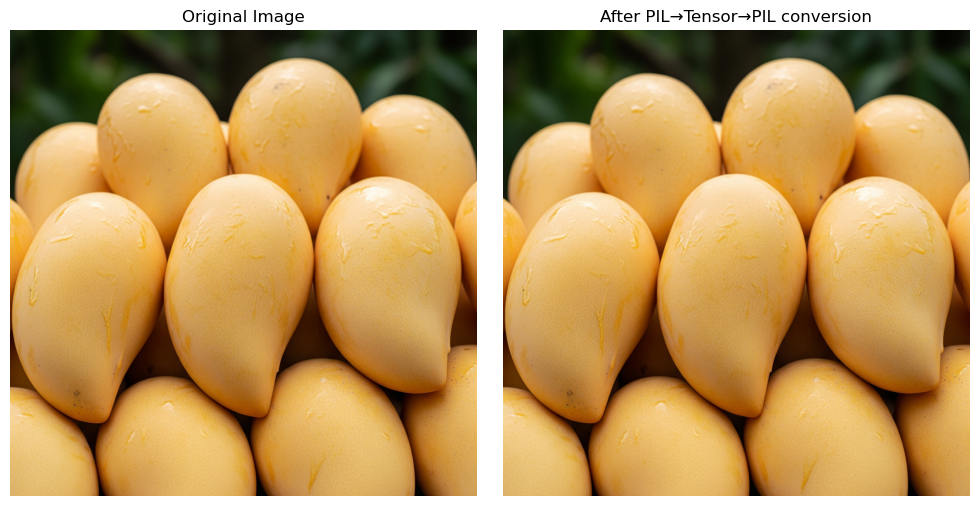

In [11]:
helper_utils.show_images([image, img_pil], titles=("Original Image", "After PIL→Tensor→PIL conversion"))

In [25]:
# path to image File
image2_path = "./images/apples.jpg"

# load image
image = read_image(image2_path)

print(f"Image tensor dimensions: {image.shape}")
print(f"Image tensor dtype: {image.dtype}")
print(f"The maximum pixel value is: {image.max()}, and the minumum is: {image.min()}\n")

Image tensor dimensions: torch.Size([3, 2048, 2048])
Image tensor dtype: torch.uint8
The maximum pixel value is: 255, and the minumum is: 0



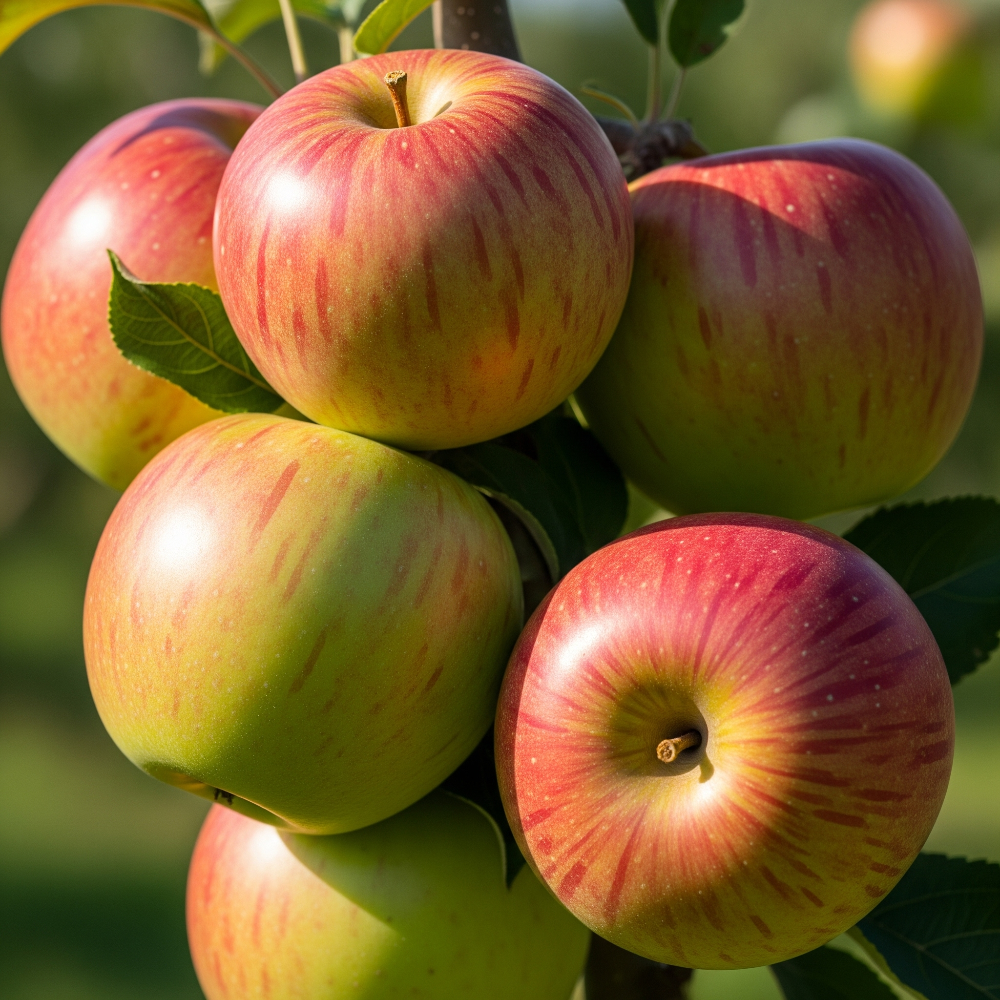

In [26]:
# Use the DisplayImage to render the image
DisplayImage(image2_path, width=500, height=500)

## Creating Image Grids with make_grid


In [28]:
# Create a batch of images (./images/ contains only 6 images). The images are loaded as 300x300 pixels
images_tensor = helper_utils.load_images("./images/")

# The size is 6 images x 3 color channels x 300 pixels height x 300 pixels width
print(f"Image tensor dimensions: {images_tensor.shape}")

Image tensor dimensions: torch.Size([6, 3, 300, 300])


* Arrange the loaded images into a grid using the <code>[make_grid()](https://docs.pytorch.org/vision/main/generated/torchvision.utils.make_grid.html)</code> function.
    * `tensor:` This needs to be a batch of images, as a **4D tensor** (`(B x C x H x W)`), to be placed into the grid.
    * `nrow=3`: Arranges the images with **3 images in each row**.
    * `padding=5`: Adds **5 pixels** of space between the images.
    * `normalize=True`: Shifts the image pixel values to a standard range (0 to 1) for consistent display.

Image tensor dimensions: torch.Size([3, 615, 920])
The maximum pixel value is: 1.0, and the minimum is: 0.0



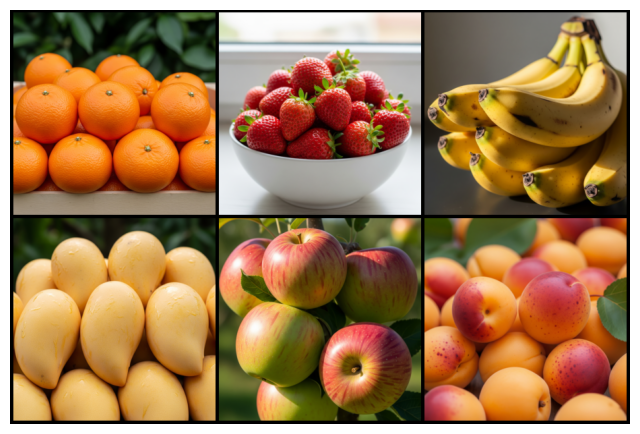

In [41]:
grid = vutils.make_grid(tensor=images_tensor, nrow=3, padding=5, normalize=True)

# the shape comes from 
# num_images/nrow*pixel_height+(num_images/nrow+1)*padding = 2*300+3*5 = 615
# nrow*pixel_width+(nrow+1)*padding = 3*300+4*5 = 920
print(f"Image tensor dimensions: {grid.shape}")
print(f"The maximum pixel value is: {grid.max()}, and the minimum is: {grid.min()}\n")

# Display
helper_utils.display_grid(grid)

## Saving Tensors as Images with save_image

* <code>[save_image()](https://docs.pytorch.org/vision/main/generated/torchvision.utils.save_image.html)</code>: Saves the image tensor to a file.
    * `tensor`: The tensor of image(s) to be saved.
    * `fp`: The file path, with the name and format for the output image.
    

In [45]:
image_path = "./fruits_grid.png"

# Save the grid as a PNG image
vutils.save_image(tensor=grid, fp=image_path)

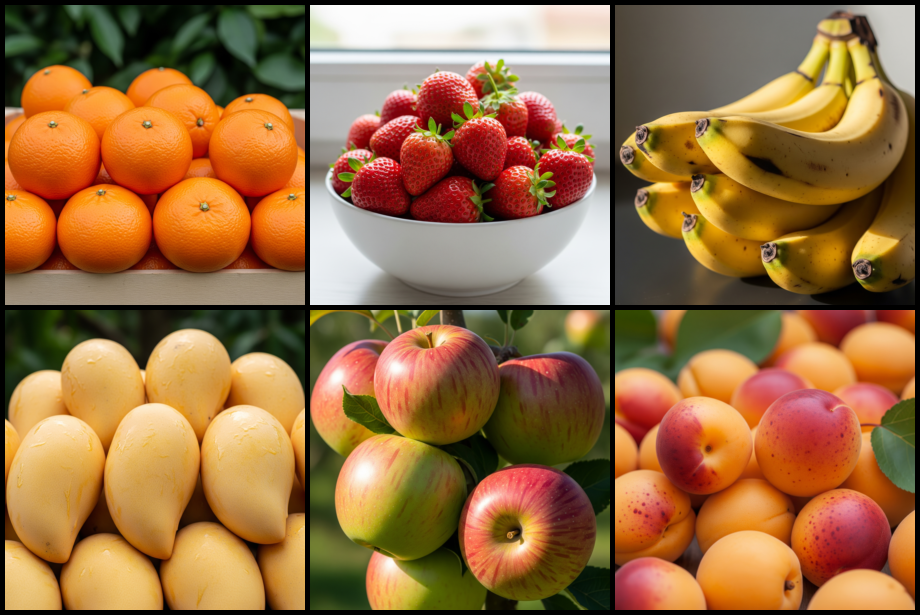

In [46]:
# Use the DisplayImage to render the image
DisplayImage(image_path)

## Image Transformations and Data Augmentation

### A Closer Look at Individual Transformations



In [47]:
original_image = Image.open('./images/strawberries.jpg')

#### Resize

The [Resize](https://docs.pytorch.org/vision/main/generated/torchvision.transforms.Resize.html) transform is a common preprocessing step to ensure all images in a batch have the same dimensions.

* It rescales an input PIL image to a desired `size`.
    * `size`: The target output size.

In [49]:
# Define the resize transformation (50x50 square)
resize_transform = transforms.Resize(size=50)

# Apply transformation
resized_image = resize_transform(original_image)

Original Dimensions: (2048, 2048)
Resized Dimensions:  (50, 50)



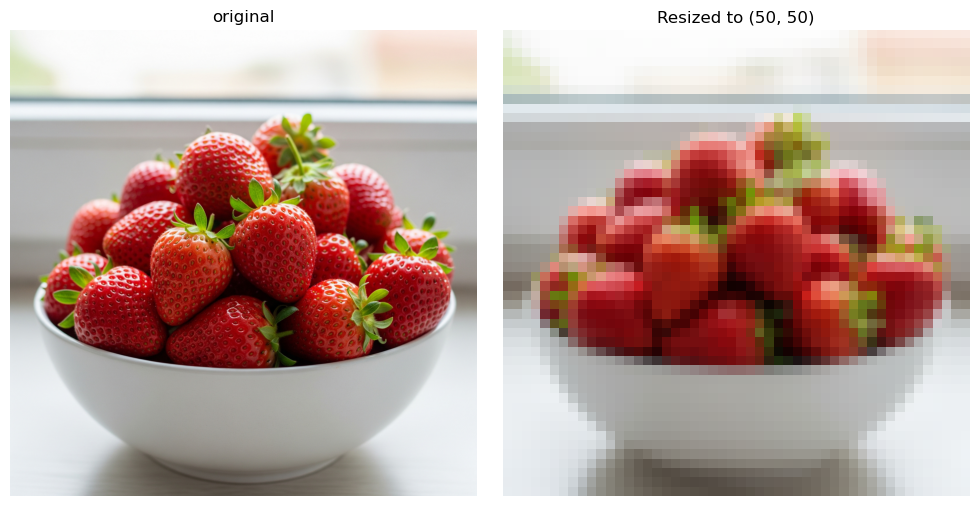

In [51]:
# (Width, Height)
print(f"Original Dimensions: {original_image.size}")
print(f"Resized Dimensions:  {resized_image.size}\n")

helper_utils.show_images(
    images=[original_image, resized_image],
    titles=("original", "Resized to (50, 50)")
)

#### CenterCrop

The [CenterCrop](https://docs.pytorch.org/vision/main/generated/torchvision.transforms.CenterCrop.html) transform is used to focus on the central part of an image, removing potentially distracting background from the edges.

* It extracts a square patch from the center of the image.
    * `size`: An integer defining the height and width of the desired crop.

In [54]:
# Define the center crop transformation (256x256)
center_crop_transform = transforms.CenterCrop(size=256)

# Apply transformation
cropped_image = center_crop_transform(original_image)

Original Dimensions: (2048, 2048)
Cropped Dimensions:  (256, 256)



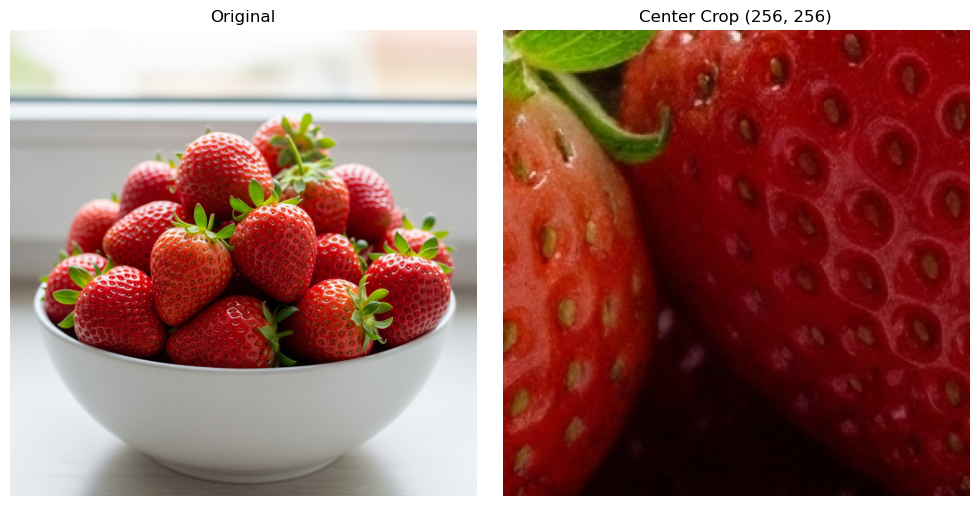

In [55]:
# (Width, Height)
print(f"Original Dimensions: {original_image.size}")
print(f"Cropped Dimensions:  {cropped_image.size}\n")

helper_utils.show_images(
    images=[original_image, cropped_image],
    titles=("Original", "Center Crop (256, 256)")
)

#### RandomResizedCrop

The [RandomResizedCrop](https://pytorch.org/vision/stable/generated/torchvision.transforms.RandomResizedCrop.html) transform is a data augmentation technique that randomly crops a portion of the image and then resizes it to a given size. This helps the model become more robust to variations in object scale and position within the image. Because it involves random selection, each time you apply this transform, you'll likely get a slightly different cropped and resized version of the image.

* It crops a random portion of an image and resizes it to a specified size.
    * `size`: The target output size.

In [57]:
# Define the RandomResizedCrop transformation (224x224)
random_resized_crop_transform = transforms.RandomResizedCrop(size=224)

# Apply the transformation
cropped_resized_image_1 = random_resized_crop_transform(original_image)
cropped_resized_image_2 = random_resized_crop_transform(original_image)
cropped_resized_image_3 = random_resized_crop_transform(original_image)

Original Dimensions: (2048, 2048)
RandomResizedCrop 1 Dimensions:  (224, 224)
RandomResizedCrop 2 Dimensions:  (224, 224)
RandomResizedCrop 3 Dimensions:  (224, 224)



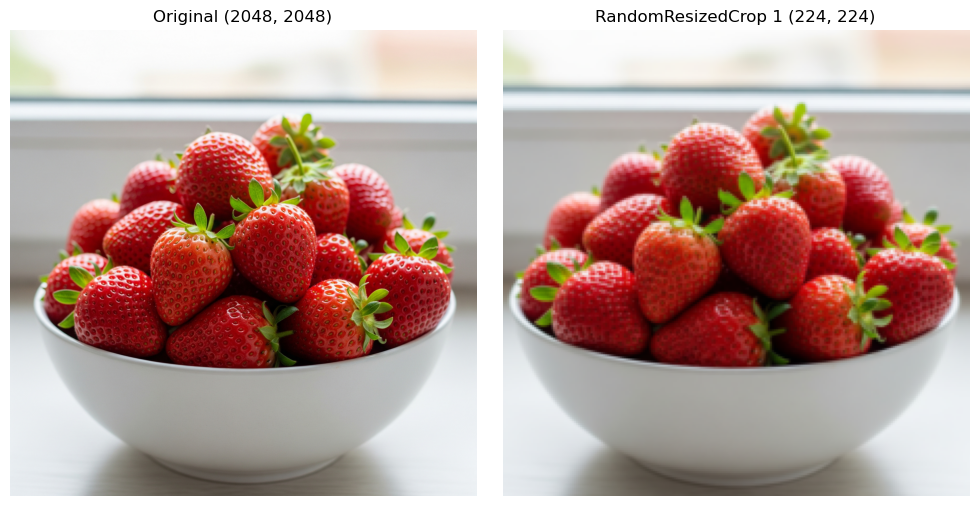

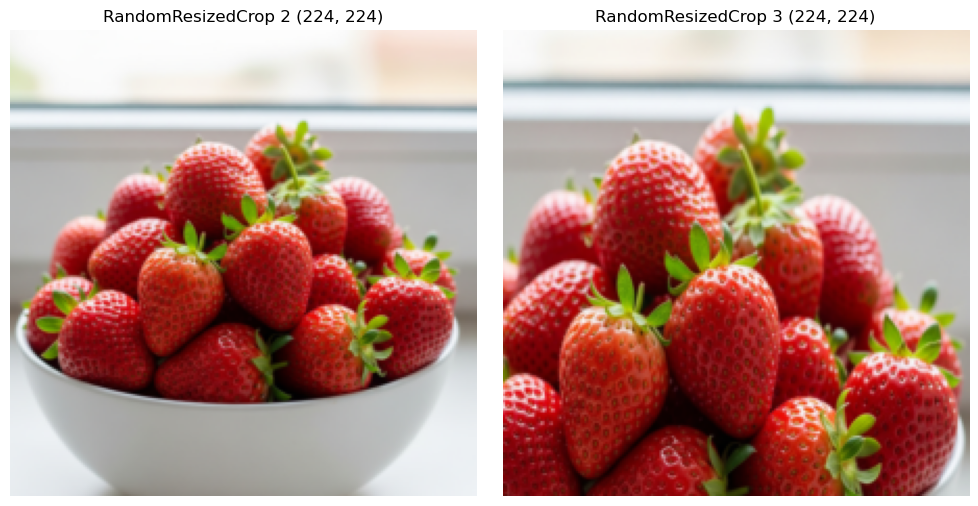

In [58]:
# (Width, Height)
print(f"Original Dimensions: {original_image.size}")
print(f"RandomResizedCrop 1 Dimensions:  {cropped_resized_image_1.size}")
print(f"RandomResizedCrop 2 Dimensions:  {cropped_resized_image_2.size}")
print(f"RandomResizedCrop 3 Dimensions:  {cropped_resized_image_3.size}\n")

helper_utils.show_images(
    images=[original_image, cropped_resized_image_1],
    titles=("Original (2048, 2048)", "RandomResizedCrop 1 (224, 224)")
)
helper_utils.show_images(
    images=[cropped_resized_image_2, cropped_resized_image_3],
    titles=("RandomResizedCrop 2 (224, 224)", "RandomResizedCrop 3 (224, 224)")
)

#### RandomHorizontalFlip
[RandomHorizontalFlip](https://docs.pytorch.org/vision/main/generated/torchvision.transforms.RandomHorizontalFlip.html) is a data augmentation technique that randomly flips the image horizontally. It teaches the model that an object's identity doesn't change if it's mirrored.

* It flips the image horizontally with a given probability.
    * `p`: The probability of the flip being applied. The default is 0.5.

In [ ]:
# Define the horizontal flip transformation
# Set p=1.0 to guarantee the flip happens for this demonstration
flip_transform = transforms.RandomHorizontalFlip(p=1.0)

# Apply transformation 
flipped_image = flip_transform(original_image)

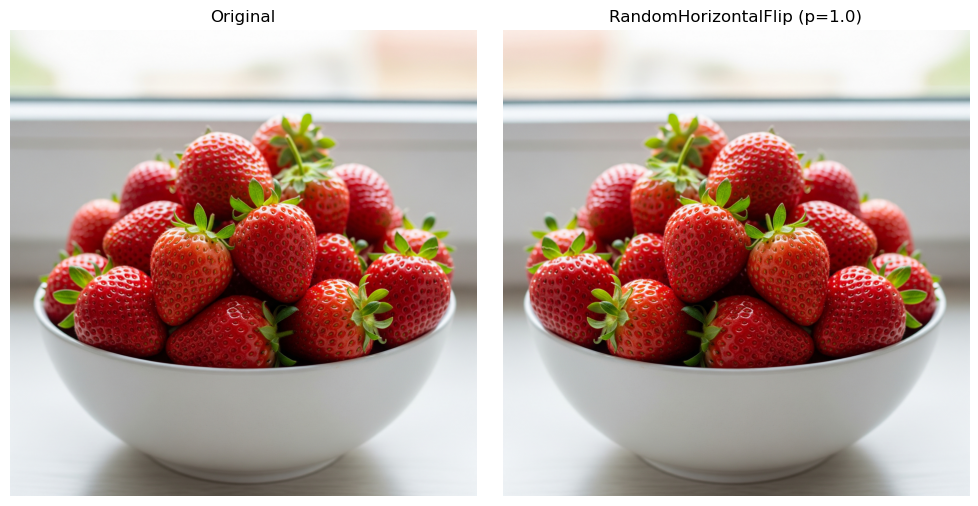

In [62]:
helper_utils.show_images(
    images = [original_image, flipped_image],
    titles = ("Original", "RandomHorizontalFlip (p=1.0)")
)

#### ColorJitter

[ColorJitter](https://docs.pytorch.org/vision/main/generated/torchvision.transforms.ColorJitter.html), a data augmentation technique, makes the model more robust to variations in lighting and color by randomly altering the image's color properties.

* It randomly changes the brightness, contrast, and saturation of an image.
    * The `brightness`, `contrast` and `saturation` parameters control the range of the random adjustments.

In [63]:
# Define the ColorJitter transformation
# The values determine the random range for each property.
jitter_transform = transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5)

# Apply the trans
jittered_image = jitter_transform(original_image)

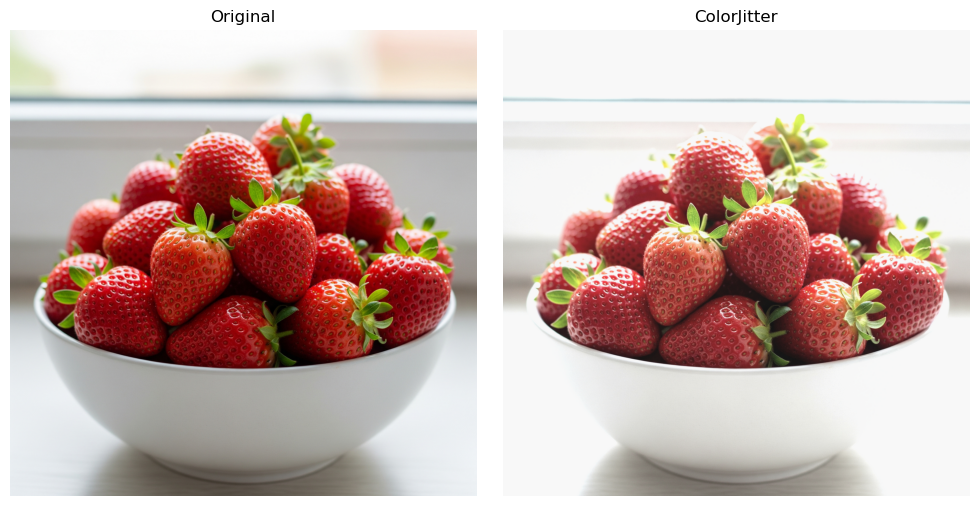

In [64]:
helper_utils.show_images(
    images=[original_image, jittered_image],
    titles=("Original", "ColorJitter")
)

#### Custom Transformations

In some cases, you may need a specific operation that isn't built-in, like simulating a particular type of camera noise. In these situations, you can create your own custom transformations.

* A custom transform is created by defining a Python class with a `__call__` method.
    * This method takes a PIL image as input and returns the modified image, allowing it to be seamlessly integrated into a `transforms.Compose` pipeline.
* Define a transform to apply salt and pepper noise, which adds random white (255) and black (0) pixels to an image. This particular transformation is considered a data augmentation technique.

In [68]:
class SaltAndPepperNoise:
    """
    A custom transform to add salt and pepper noise to a PIL image.

    Args:
        salt_vs_pepper (float): The ratio of salt to pepper noise.
                                (e.g., 0.5 is an equal amount of each).
        amount (float): The total proportion of pixels to be affected by noise.
    """

    def __init__(self, salt_vs_pepper=0.5, amount=0.55):
        self.s_vs_p = salt_vs_pepper
        self.amount= amount

    def __call__(self, image):
        # Make a copy of the image
        output = np.copy(np.array(image))

        # Add salt noise
        num_salt = np.ceil(self.amount * image.size[0] * image.size[1] * self.s_vs_p)

        # Generate random coord for salt noise
        coords = [np.random.randint(0, i - 1, int(num_salt)) for i in image.size]

        # Set pixels to white
        output[coords[1], coords[0]] = 255

        # Add pepper noise 
        num_pepper = np.ceil(self.amount * image.size[0] * image.size[1] * (1.0 - self.s_vs_p))

        # Generate random coords for pepper noise
        coords = [np.random.randint(0, i -1, int(num_pepper)) for i in image.size]

        # Set pixels to black
        output[coords[1], coords[0]] = 0

        # Convert the NumPy array back to a PIL image
        return Image.fromarray(output)

    def __repr__(self):
        return self.__class__.__name__ + f'(salt_vs_pepper={self.s_vs_p}, amount={self.amount})'

In [69]:
# Instantiate our custom transformation
sp_transform = SaltAndPepperNoise(salt_vs_pepper=0.5, amount=0.5)

# apply the trans
sp_image = sp_transform(original_image)

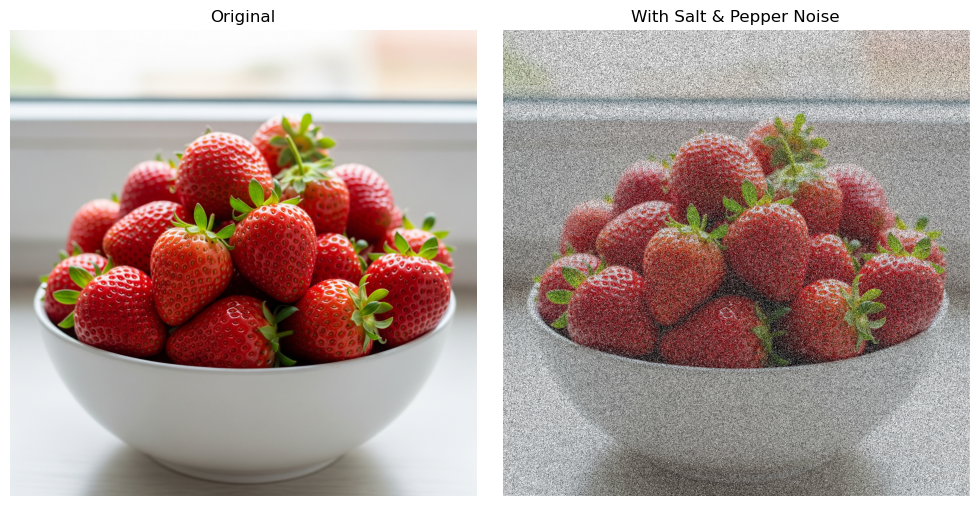

In [70]:
helper_utils.show_images(
    images=[original_image, sp_image],
    titles=("Original", "With Salt & Pepper Noise")
)

#### Normalize

[Normalize](https://docs.pytorch.org/vision/main/generated/torchvision.transforms.Normalize.html?highlight=normalize) is a preprocessing step that standardizes the pixel values of an image. It subtracts the mean and divides by the standard deviation for each channel. This helps the model converge faster during training.

* It operates on an image tensor, subtracting the mean and dividing by the standard deviation for each channel.
    * `mean`: A sequence of mean values for each channel.
    * `std`: A sequence of standard deviation values for each channel.

**Note**: `transforms.ToTensor()` must always be applied before this transformation, as it operates on tensors, not PIL images.    

In [72]:
# Convert to tensor (scales to [0, 1])
tensor_image = transforms.ToTensor()(original_image)

# Define the normalization transform using ImageNet stats
normalize_transform = transforms.Normalize(
    mean = [0.485, 0.456, 0.406],
    std = [0.229, 0.224, 0.225]
)

# Apply the transformation
normalized_tensor = normalize_transform(tensor_image)

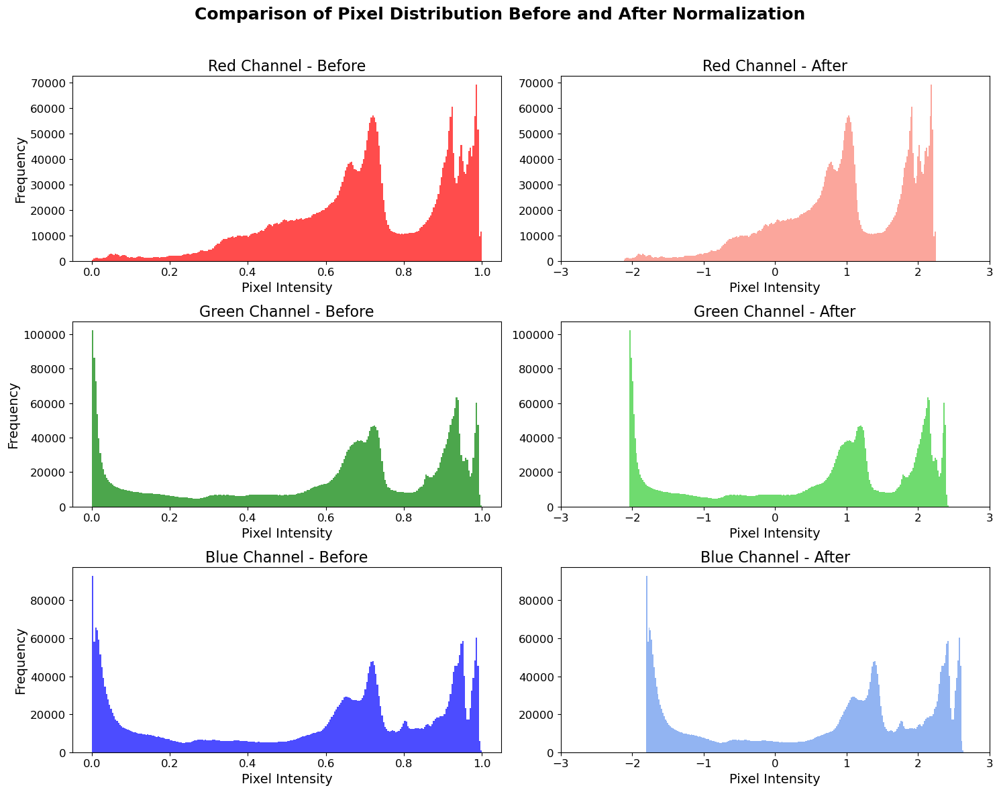

In [73]:
# Visualize the distribution before and after normalization
helper_utils.plot_histogram(tensor_image, normalized_tensor, "Comparison of Pixel Distribution Before and After Normalization")

##### Calculating Dataset Mean and Standard Deviation

When applying the normalization transformation, you used the well known mean and standard deviation from the ImageNet dataset:

> `mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]`

Using the well-known mean and standard deviation from a large dataset like ImageNet is a common and highly effective practice, especially when fine-tuning a pre-trained model. This approach aligns your new data with the statistical properties the model's weights were originally calibrated to, ensuring a stable and reliable starting point for training.

However, for optimal results, particularly when training a model from scratch, it is best to normalize data using its own specific statistics. Every dataset has a unique distribution of colors and brightness, and calculating its precise mean and standard deviation ensures the most accurate normalization possible, which can lead to improved model performance.

Think of these as strong recommendations, not strict rules. While using ImageNet stats is the safest approach for fine-tuning, you can use your own dataset's stats. Doing so may require more extensive training for the model to adapt to the new data distribution. For training from scratch, on the other hand, calculating your own stats is essential.

* The function, `calculate_mean_std`, iterates through the entire dataset to accumulate the sum and the sum-of-squares of the pixel values for each channel.
    * These accumulated values are then used to compute the final mean and standard deviation across all images in the dataset.

In [74]:
def calculate_mean_std(dataset):
    """
    Calculates the mean and standard deviation of a PyTorch dataset.

    Args:
        dataset (torch.utils.data.Dataset): The dataset for which to
                                            calculate the stats. It should
                                            return image tensors.

    Returns:
        (torch.Tensor, torch.Tensor): A tuple containing the mean and
                                      standard deviation tensors, each of
                                      shape (C,).
    """
    # Create a DataLoader to iterate through the dataset in batches for efficiency.
    # shuffle=False because the order of images doesn't matter for this calculation.
    loader = data.DataLoader(dataset, batch_size=64, shuffle=False, num_workers=0)

    # Initialize tensors to store the sum of pixel values for each (RGB) channel.
    channel_sum = torch.zeros(3)

    # Initialize tensors to store the sum of squared pixel values for each channel.
    channel_sum_sq = torch.zeros(3)

    # Initialize a counter for the total number of pixels.
    num_pixels = 0

    # Wrap the loader with tqdm to create a progress bar for monitoring.
    for images, _ in tqdm(loader, desc="Calculating Datasets Stats"):
        # Add the total number of pixels in this batch  to the running total
        num_pixels += images.size(0) * images.size(2) * images.size(3)

        # Sum the pixel values across the batch, height, and width dimensions,
        # leaving only the channel dimension. Add this to the running total.
        channel_sum += images.sum(dim=[0, 2, 3])

        # Square each pixel value, then sum them up similarly to the step above.
        channel_sum_sq += (images ** 2).sum(dim=[0, 2, 3])

    # Calculate the mean for each channel.
    mean = channel_sum / num_pixels

    # Calculate the standard deviation using the formula: sqrt(E[X^2] - E[X]^2)
    std = (channel_sum_sq / num_pixels - mean ** 2) ** 0.5

    # Return the calculated mean and standard deviation.
    return mean, std

Time to see the `calculate_mean_std function` in action. You'll now compute the specific statistics for the **OxfordIIITPet dataset**, and you'll use these calculated values in your final augmentation pipeline.

But before you can calculate the stats, you need to define a simple transformation pipeline.

**Why is `simple_transform` needed?**

You might wonder why you need to transform the images at all just to calculate their mean. Here's why this is important: 

* **`transforms.Resize((100, 100))`**: This performs two key functions: 
    * **Standardization**: It ensures every image has the exact same dimensions. This is important for a fair calculation, as it prevents larger or smaller images from skewing the overall result.
    * **Efficiency**: You deliberately use a *small* size (`(100, 100)`) as a practical optimization. Processing `100x100` images (10,000 pixels) is much faster than using a larger size like `224x224` (50,176 pixels), and the resulting stats are still an excellent approximation.
* **`transforms.ToTensor()`**: This is essential because your calculation function operates on numerical tensors, not PIL images. This transform converts the images into the required format and scales their pixel values to the `[0.0, 1.0]` range, which is standard for these types of computations.

In [76]:
# Define a simple transformation
simple_transform = transforms.Compose([
    transforms.Resize((100, 100)),
    transforms.ToTensor()
])

# Load the OxfordIIITPet dataset, applying the simple transform to each image
my_dataset = datasets.OxfordIIITPet(root=ox3_pet_data_path,
                                    split='test',               # Specify using the test set
                                    download=ox3_pet_download,  # Download if not already present
                                    transform=simple_transform  # # Apply the defined transformations
                                    )

# Compute the mean and standard deviation for the dataset
dataset_mean, dataset_std = calculate_mean_std(my_dataset)

print(f"\nCalculation Complete.")
print(f"Dataset Mean: {dataset_mean}")
print(f"Dataset Std:  {dataset_std}")

100%|██████████| 791918971/791918971 [13:38<00:00, 967483.02it/s]  


Extracting oxford3pet_data/oxford-iiit-pet/images.tar.gz to oxford3pet_data/oxford-iiit-pet


100%|██████████| 19173078/19173078 [00:56<00:00, 341635.41it/s]


Extracting oxford3pet_data/oxford-iiit-pet/annotations.tar.gz to oxford3pet_data/oxford-iiit-pet


Calculating Datasets Stats: 100%|██████████| 58/58 [00:13<00:00,  4.45it/s]


Calculation Complete.
Dataset Mean: tensor([0.4845, 0.4529, 0.3959])
Dataset Std:  tensor([0.2612, 0.2572, 0.2662])


## Composing Transformations for Data Augmentation

The real power of transformations comes from chaining them together. `transforms.Compose` creates a single pipeline that applies a sequence of transformations to an image in order. 

* You will create two pipelines: 
    * `base_transform`: A simple pipeline with just the essential preprocessing steps (resizing and cropping). Normalization is intentionally skipped so the output images are visually correct and can serve as a clean baseline for comparison.
    * `full_augmentation_pipeline`: This includes your random, augmentative transforms and normalization using the stats you just calculated.
    
This will allow you to directly compare a "clean" batch of images with a fully augmented one.

In [78]:
# A simple transform to get a clean, un-augmented version of the images
base_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor()
    # Skip normalization to keep the image's pixel values in a display-friendly range.
])

# The full augmentation pipeline with all random transformations
full_augmentation_pipeline = transforms.Compose([
    transforms.RandomResizedCrop(size=224),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ColorJitter(brightness=0.05, contrast=0.05),
    SaltAndPepperNoise(amount=0.001),
    transforms.ToTensor(),
    # Using `mean` and `std` values as calculated on the 100x100 images
    transforms.Normalize(mean=dataset_mean, std=dataset_std)
])

### A Dataset Without Augmentations

First, take a look at the data in its original form.

* Use a `DataLoader` with your `base_transform` pipeline to load a batch of images.
    * This applies only the necessary resizing and cropping, giving you a clean, consistent baseline to see what the images look like before any random augmentation is applied.

In [79]:
# Load the dataset with ONLY the base transforms
original_dataset = datasets.OxfordIIITPet(root=ox3_pet_data_path,
                                          split='test',
                                          download=ox3_pet_download,
                                          transform=base_transform
                                        )

# Create a DataLoader for the original images
original_loader = data.DataLoader(original_dataset, batch_size=9, shuffle=True)

Original Un-augmented Batch:



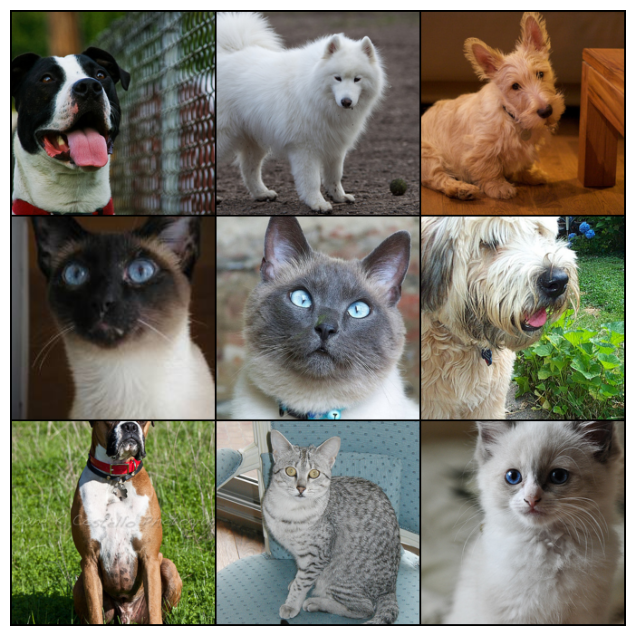

In [80]:
# Get one fixed batch of original images
original_images, _ = next(iter(original_loader))

# Create a grid from the batch of images, arranging them with 3 images per row.
grid = vutils.make_grid(original_images, nrow=3, padding=2)

print("Original Un-augmented Batch:\n")
helper_utils.display_grid(grid)

### Applying the Augmentation Pipeline

Now, you'll see the effect of the `full_augmentation_pipeline`. You will take the same batch of original images from the previous step and apply the full pipeline to each one. You'll do this in a loop to see how the random augmentations change with each run.

This demonstrates the core concept of data augmentation. Because the pipeline includes random operations, applying it to an image produces a slightly different result each time. This is precisely what happens during model training when you pass an augmentation pipeline to a `DataLoader`. The transforms are applied on the fly, so with each epoch, your model is fed a unique version of the same original image. This process virtually increases the size and diversity of your training data without you having to collect more images, which helps your model generalize better and reduces overfitting.

**Note:** the image colors may appear different because each color channel has been normalized in this transformation. Feel free to comment out the `Normalize` and observe the difference in the images.


Augmented Batch - Run #1


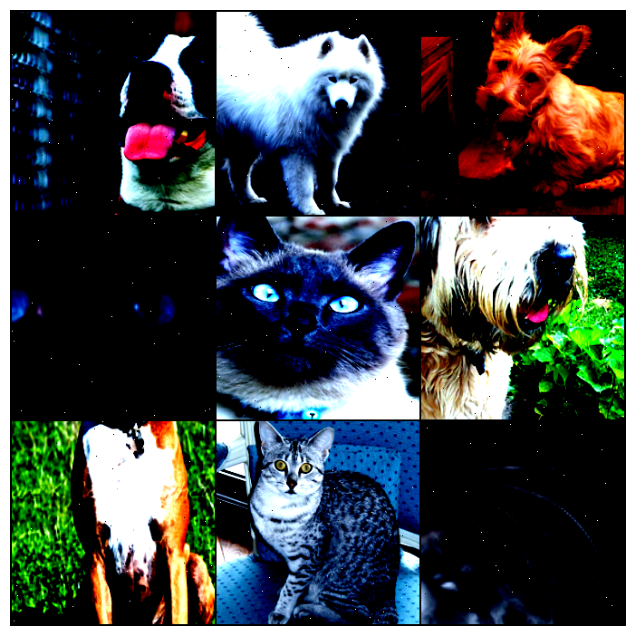


Augmented Batch - Run #2


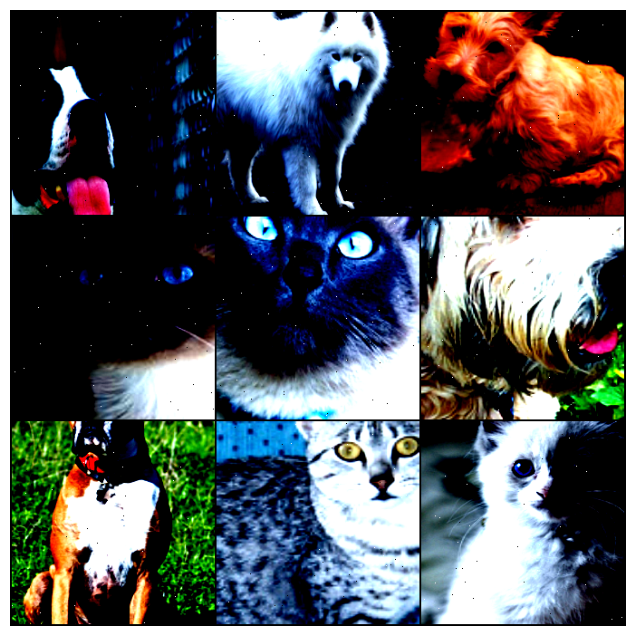


Augmented Batch - Run #3


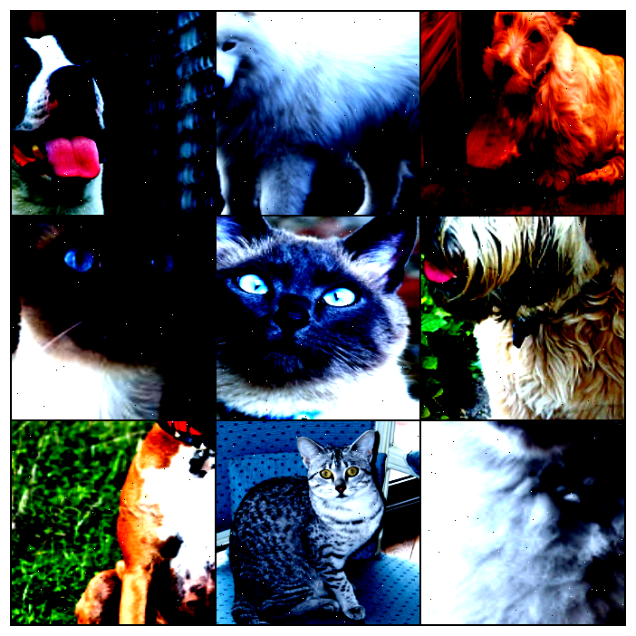

In [81]:
# Use a loop to apply different random augmentations
for i in range(3):
    augmented_batch = []

    # Loop through each ori image in the fixed batch
    for img_tensor in original_images:

        # Convert tensor back to PIL image to apply random transforms
        img_pil = transforms.ToPILImage()(img_tensor)

        # Apply the random augmentation pipeline
        augmented_tensor = full_augmentation_pipeline(img_pil)

        # Add the augmented tensor to the list for display
        augmented_batch.append(augmented_tensor)

    # Stack the list of augmented tensors into a single batch tensor
    final_batch = torch.stack(augmented_batch)

    # Create a grid from the batch of images, arranging them with 3 images per row
    grid = vutils.make_grid(final_batch, nrow=3, padding=2)

    print(f"\nAugmented Batch - Run #{i + 1}")
    helper_utils.display_grid(grid)